In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import importlib
from scipy.ndimage import median_filter
import glob
from windrose import WindroseAxes
import cmcrameri as cmc
from cmcrameri import cm
from scipy.stats import linregress
import sys
import os
from pathlib import Path
import pickle

# Add project 'src' directory to sys.path when running from the notebooks/ folder
# (notebooks/ is expected to be inside the repo; repo_root = parent of cwd)
repo_root = Path.cwd().parent
src_path = str(repo_root / 'src')
if src_path not in sys.path:
    sys.path.insert(0, src_path)

# Import modules from the installed package. If this fails, the editable install
# (`pip install -e .`) may be missing or kernel needs restart.
try:
    from ec.func_read_data import *
    from mo.func_mo import *
    from spc.normalize import *
    from plotting.funcs_plots import *
    from ec.sensor_info import *
except Exception as e:
    print('Package import failed:', e)
    print('Make sure you ran `pip install -e .` (editable install) and restart the kernel, or that src/ exists at:', src_path)
else:
    # For development: auto-reload modules (keep this enabled while editing source files)
    %load_ext autoreload
    %autoreload 2

In [5]:
def load_pea_pres_data(sensors, folder='/media/engbers/2906-62A0/pea_data_sending/'):
    """
    Load and concatenate .dat files for specified sensors.
    
    Parameters:
    -----------
    sensors : list of str
        List of sensor name prefixes to match
    folder : str
        Path to folder containing .dat files
        
    Returns:
    --------
    dict : Dictionary with sensor names as keys and concatenated DataFrames as values
    """
    dict = {}
    
    for sensor in sensors:
        for file in glob.glob(os.path.join(folder, '*')):
            if os.path.basename(file).startswith(sensor) and file.endswith('.dat'):
                df = pd.read_csv(file, delimiter=',', header=1, low_memory=False)
                df = df.drop([0, 1])
                # Convert TIMESTAMP to datetime and set as index
                df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])
                df.set_index('TIMESTAMP', inplace=True)
                # Convert all remaining columns to numeric, coercing errors to NaN
                df = df.apply(pd.to_numeric, errors='coerce')
                
                if sensor not in dict:
                    dict[sensor] = df
                else:
                    dict[sensor] = pd.concat([dict[sensor], df], axis=0)
        
        # After processing all files for this sensor, sort and remove duplicates
        if sensor in dict:
            dict[sensor] = dict[sensor].sort_index()  # Sort by timestamp
            dict[sensor] = dict[sensor][~dict[sensor].index.duplicated(keep='first')]  # Remove duplicates, keep first
    
    return dict

# Usage
data = load_pea_pres_data(['peasfc_wind', 'peasfc_OneMin', 'peaupper', 'pealower', 'peabottom'])

In [1]:
"""READ AND CLEAN SLOWDATA"""
folder='/home/engbers/Documents/PhD/EC_data_convert/converted/'
sensor='SFC'
start='2024-01-01 00:00'
end='2025-01-01 00:00'

"""GET SENSOR INFO"""
plim, calibration_coefficients, heights = get_sensor_info(sensor, 2024)

"""READ FAST AND SLOW DATA from folder"""
slowdata=read_data(folder, 'slow', sensor, start, end, plot_data=False)

"""CLEAN SLOWDATA"""
slowdata_cleaned=clean_slowdata(slowdata)

NameError: name 'get_sensor_info' is not defined

Data type: float64

First few rows:
TIMESTAMP
2026-01-26 00:01:00    5.683
2026-01-26 00:02:00    5.923
2026-01-26 00:03:00    5.999
2026-01-26 00:04:00    6.079
2026-01-26 00:05:00    5.679
Name: WS1_Avg, dtype: float64


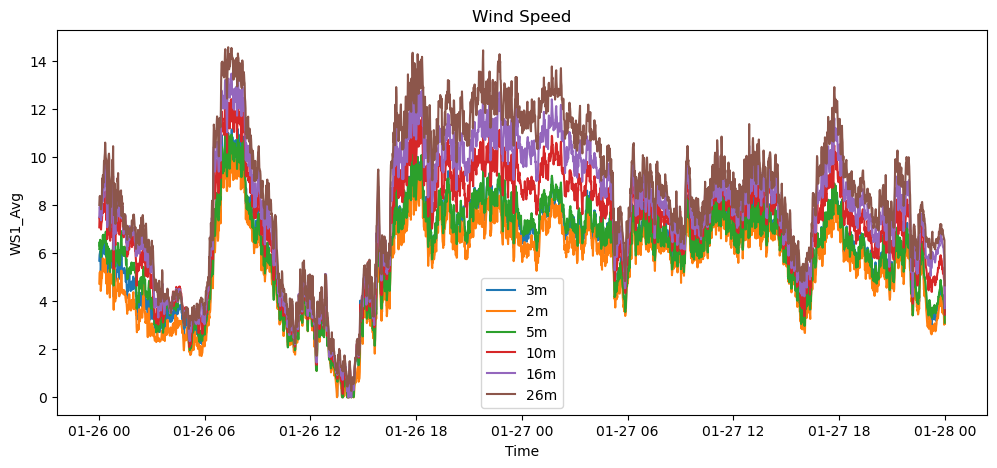

In [6]:
# Check the data - index should be datetime, WS1_Avg should be numeric
# print("Index type:", type(data['peasfc_wind'].index[0]))
print("Data type:", data['peasfc_wind']['WS1_Avg'].dtype)
print("\nFirst few rows:")
print(data['peasfc_wind']['WS1_Avg'].head())

start='2026-01-20 22:00'
end='2026-01-28 23:00'
# Plot it
plt.figure(figsize=(12, 5))
plt.plot(data['peasfc_wind']['WS1_Avg'][start:end], label='3m')
plt.plot(data['peasfc_wind']['WS2_Avg'][start:end], label='2m')
plt.plot(data['peabottom']['WS_5m_Avg'][start:end], label='5m')
plt.plot(data['pealower']['WS_10m_Avg'][start:end], label='10m')
plt.plot(data['pealower']['WS_16m_Avg'][start:end], label='16m')
plt.plot(data['peaupper']['WS_26m_Avg'][start:end], label='26m')
plt.legend()
plt.xlabel('Time')
plt.ylabel('WS1_Avg')
plt.title('Wind Speed')
plt.show()

In [ ]:
sel_time = '2026-01-26 07:00'

# Create figure with 2 subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8), sharey=True)

# Wind speed profile (left panel)
heights_wind = [0,3.24, 1.74, 5.17, 6.06, 10.3, 16.86, 18.4, 25.37, 26.3]
ws_values = [
    0,
    data['peasfc_wind']['WS1_Avg'][sel_time],
    data['peasfc_wind']['WS2_Avg'][sel_time],
    np.sqrt(data['peabottom']['Ux_5m_Avg']**2 + data['peabottom']['Uy_5m_Avg']**2+ data['peabottom']['Uz_5m_Avg']**2)[sel_time],
    data['peabottom']['WS_5m_Avg'][sel_time],
    data['pealower']['WS_10m_Avg'][sel_time],
    np.sqrt(data['pealower']['Ux_16m_Avg']**2 + data['pealower']['Uy_16m_Avg']**2+ data['pealower']['Uz_16m_Avg']**2)[sel_time],
    data['pealower']['WS_16m_Avg'][sel_time],
    np.sqrt(data['peaupper']['Ux_26m_Avg']**2 + data['peaupper']['Uy_26m_Avg']**2+ data['peaupper']['Uz_26m_Avg']**2)[sel_time],

    data['peaupper']['WS_26m_Avg'][sel_time]
]
ws_norm = plt.Normalize(vmin=min(ws_values), vmax=max(ws_values))
ws_colors = cm.nuuk(ws_norm(ws_values))

for i, (ws, h) in enumerate(zip(ws_values, heights_wind)):
    ax1.scatter(ws, h, s=120, c=[ws_colors[i]], edgecolors='black', linewidth=1.5, alpha=0.9, zorder=3)

ax1.set_xlabel('Wind Speed [m/s]', fontsize=16)
ax1.set_ylabel('Height [m]', fontsize=16)
ax1.set_title('Wind Profile', fontsize=18, fontweight='bold')
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.grid(True, alpha=0.3, zorder=0)

# Temperature profile (right panel)
heights_temp = [0,1.55, 5.7, 10.8, 17.5, 26.1]
temp_values = [
    data['peasfc_OneMin']['SFTempK'][sel_time]-273.15,
    data['peasfc_OneMin']['TA'][sel_time],
    data['peabottom']['Temp_5m_Avg'][sel_time],
    data['pealower']['Temp_10m_Avg'][sel_time],
    data['pealower']['Temp_16m_Avg'][sel_time],
    data['peaupper']['Temp_26m_Avg'][sel_time]
]
temp_norm = plt.Normalize(vmin=min(temp_values), vmax=max(temp_values))
temp_colors = cm.oslo(temp_norm(temp_values))

for i, (temp, h) in enumerate(zip(temp_values, heights_temp)):
    ax2.scatter(temp, h, s=120, c=[temp_colors[i]], edgecolors='black', linewidth=1.5, alpha=0.9, zorder=3)

ax2.set_xlabel('Temperature [°C]', fontsize=16)
# ax2.set_ylabel('Height [m]', fontsize=16)
ax2.set_title('Temperature Profile', fontsize=18, fontweight='bold')
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.grid(True, alpha=0.3, zorder=0)

plt.tight_layout()
plt.show()

/tmp/ipykernel_69484/3865673099.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saving 94 frames as PDFs...
Saved 10/94 frames
Saved 20/94 frames
Saved 30/94 frames
Saved 40/94 frames
Saved 50/94 frames
Saved 60/94 frames
Saved 70/94 frames
Saved 80/94 frames
Saved 90/94 frames
All frames saved in 'animation_frames/' directory


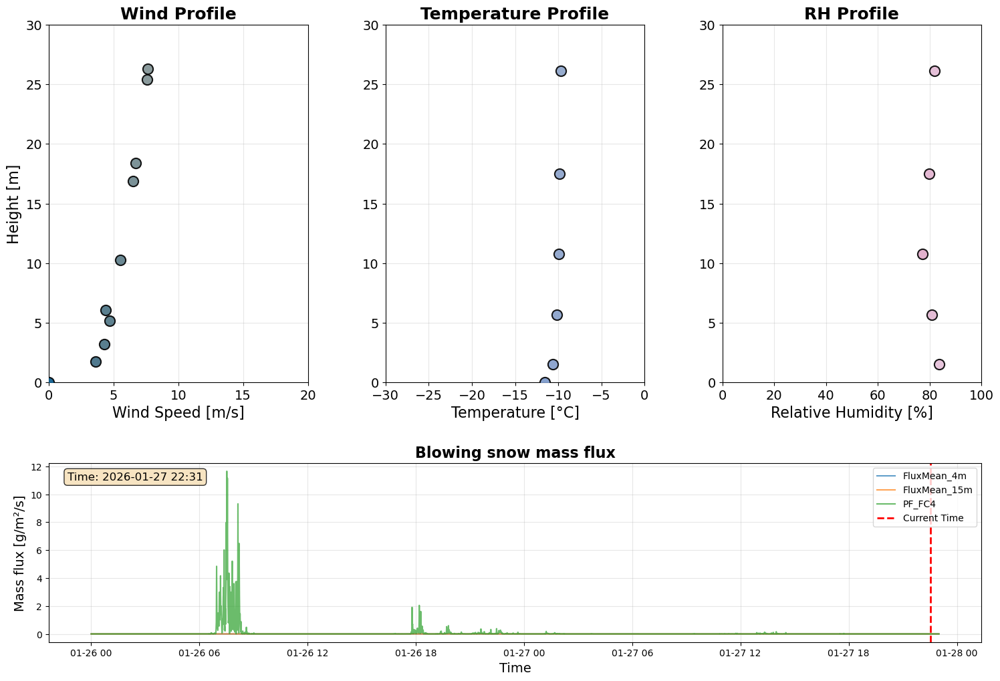

In [14]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define time range for animation
start = '2026-01-26 00:01'
end = '2026-01-27 23:00'
time_range = pd.date_range(start=start, end=end, freq='1min')

# Create figure with 4 subplots: 3 on top (side by side), 1 on bottom
fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(2, 3, height_ratios=[2, 1], hspace=0.3, wspace=0.3)
ax1 = fig.add_subplot(gs[0, 0])  # Wind profile (top left)
ax2 = fig.add_subplot(gs[0, 1], sharey=ax1)  # Temperature profile (top middle)
ax4 = fig.add_subplot(gs[0, 2], sharey=ax1)  # RH profile (top right)    
ax3 = fig.add_subplot(gs[1, :])  # Flux time series (bottom, full width)

# Plot flux time series on bottom subplot (this stays static)
ax3.plot(data['pealower']['FluxMean_4m'][start:end], label='FluxMean_4m', alpha=0.7)
ax3.plot(data['pealower']['FluxMean_15m'][start:end], label='FluxMean_15m', alpha=0.7)
ax3.plot(data['peasfc_OneMin']['PF_FC4'][start:end], label='PF_FC4', alpha=0.7)
ax3.set_xlabel('Time', fontsize=14)
ax3.set_ylabel('Mass flux [g/m²/s]', fontsize=14)
ax3.set_title('Blowing snow mass flux', fontsize=16, fontweight='bold')
ax3.legend(loc='upper right')
ax3.grid(True, alpha=0.3)

# Create vertical line indicator for current time
time_indicator = ax3.axvline(x=time_range[0], color='red', linewidth=2, linestyle='--', label='Current Time')
ax3.legend(loc='upper right')

# Text annotation for timestamp on flux plot
time_text = ax3.text(0.02, 0.95, '', transform=ax3.transAxes, fontsize=12, 
                     verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

def init():
    """Initialize animation"""
    ax1.clear()
    ax2.clear()
    ax4.clear()
    return []

def animate(frame):
    """Update function for animation"""
    sel_time = time_range[frame]
    
    # Clear previous plots
    ax1.clear()
    ax2.clear()
    ax4.clear()
    
    # Wind speed profile (left panel)
    heights_wind = [0, 3.24, 1.74, 5.17, 6.06, 10.25, 16.86, 18.4, 25.37, 26.3]
    ws_values = [
        0,
        data['peasfc_wind']['WS1_Avg'][sel_time],
        data['peasfc_wind']['WS2_Avg'][sel_time],
        np.sqrt(data['peabottom']['Ux_5m_Avg']**2 + data['peabottom']['Uy_5m_Avg']**2 + data['peabottom']['Uz_5m_Avg']**2)[sel_time],
        data['peabottom']['WS_5m_Avg'][sel_time],
        data['pealower']['WS_10m_Avg'][sel_time],
        np.sqrt(data['pealower']['Ux_16m_Avg']**2 + data['pealower']['Uy_16m_Avg']**2 + data['pealower']['Uz_16m_Avg']**2)[sel_time],
        data['pealower']['WS_16m_Avg'][sel_time],
        np.sqrt(data['peaupper']['Ux_26m_Avg']**2 + data['peaupper']['Uy_26m_Avg']**2 + data['peaupper']['Uz_26m_Avg']**2)[sel_time],
        data['peaupper']['WS_26m_Avg'][sel_time]
    ]
    ws_norm = plt.Normalize(vmin=0, vmax=20)  # Fixed scale for consistency
    ws_colors = cm.nuuk(ws_norm(ws_values))
    
    for i, (ws, h) in enumerate(zip(ws_values, heights_wind)):
        ax1.scatter(ws, h, s=120, c=[ws_colors[i]], edgecolors='black', linewidth=1.5, alpha=0.9, zorder=3)
    
    ax1.set_xlabel('Wind Speed [m/s]', fontsize=16)
    ax1.set_ylabel('Height [m]', fontsize=16)
    ax1.set_title('Wind Profile', fontsize=18, fontweight='bold')
    ax1.tick_params(axis='both', which='major', labelsize=14)
    ax1.grid(True, alpha=0.3, zorder=0)
    ax1.set_xlim(0, 20)  # Fixed scale
    ax1.set_ylim(0, 30)
    
    # Temperature profile (middle panel)
    heights_temp = [0, 1.55, 5.7, 10.8, 17.5, 26.1]
    temp_values = [
        data['peasfc_OneMin']['SFTempK'][sel_time] - 273.15,
        data['peasfc_OneMin']['TA'][sel_time],
        data['peabottom']['Temp_5m_Avg'][sel_time],
        data['pealower']['Temp_10m_Avg'][sel_time],
        data['pealower']['Temp_16m_Avg'][sel_time],
        data['peaupper']['Temp_26m_Avg'][sel_time]
    ]
    temp_norm = plt.Normalize(vmin=-30, vmax=0)  # Fixed scale for consistency
    temp_colors = cm.oslo(temp_norm(temp_values))
    
    for i, (temp, h) in enumerate(zip(temp_values, heights_temp)):
        ax2.scatter(temp, h, s=120, c=[temp_colors[i]], edgecolors='black', linewidth=1.5, alpha=0.9, zorder=3)
    
    ax2.set_xlabel('Temperature [°C]', fontsize=16)
    ax2.set_title('Temperature Profile', fontsize=18, fontweight='bold')
    ax2.tick_params(axis='both', which='major', labelsize=14)
    ax2.grid(True, alpha=0.3, zorder=0)
    ax2.set_xlim(-30, 0)  # Fixed scale

    # RH profile (right panel)
    heights_rh = [1.55, 5.7, 10.8, 17.5, 26.1]
    rh_values = [
        data['peasfc_OneMin']['RH'][sel_time],
        data['peabottom']['RH_5m_Avg'][sel_time],
        data['pealower']['RH_10m_Avg'][sel_time],
        data['pealower']['RH_16m_Avg'][sel_time]*100,
        data['peaupper']['RH_26m_Avg'][sel_time]*100
    ]
    rh_norm = plt.Normalize(vmin=0, vmax=100)  # Fixed scale for consistency
    rh_colors = cm.acton(rh_norm(rh_values))
    
    for i, (rh, h) in enumerate(zip(rh_values, heights_rh)):
        ax4.scatter(rh, h, s=120, c=[rh_colors[i]], edgecolors='black', linewidth=1.5, alpha=0.9, zorder=3)
    
    ax4.set_xlabel('Relative Humidity [%]', fontsize=16)
    ax4.set_title('RH Profile', fontsize=18, fontweight='bold')
    ax4.tick_params(axis='both', which='major', labelsize=14)
    ax4.grid(True, alpha=0.3, zorder=0)
    ax4.set_xlim(0, 100)  # Fixed scale
    
    # Update time indicator on flux plot
    time_indicator.set_xdata([sel_time, sel_time])
    time_text.set_text(f'Time: {sel_time.strftime("%Y-%m-%d %H:%M")}')
    
    return []

# Create animation (sample every 60 minutes for reasonable speed)
frames = range(0, len(time_range), 30)  # Every 30 minutes
anim = FuncAnimation(fig, animate, init_func=init, frames=frames, 
                     interval=200, blit=True, repeat=True)

plt.tight_layout()

# Save as GIF
anim.save('blowingsnowtimeseries.gif', writer='pillow', fps=30)

# Save each frame as a separate PDF
import os
os.makedirs('/home/engbers/Documents/PhD/Candidacy exam/Candidacy_presentation/animation_frames', exist_ok=True)
print(f"Saving {len(frames)} frames as PDFs...")

for i, frame_idx in enumerate(frames):
    animate(frame_idx)
    timestamp = time_range[frame_idx].strftime('%Y%m%d_%H%M')
    plt.savefig(f'/home/engbers/Documents/PhD/Candidacy exam/Candidacy_presentation/animation_frames/frame_{i:03d}_{timestamp}.pdf', 
                format='pdf', dpi=150, bbox_inches='tight')
    if (i + 1) % 10 == 0:
        print(f"Saved {i + 1}/{len(frames)} frames")

print(f"All frames saved in 'animation_frames/' directory")

# To display in notebook
HTML(anim.to_jshtml())

In [12]:
from PIL import Image
img = Image.open('blowingsnowtimeseries.gif')
img.seek(0)  # Get first frame
img.save('/home/engbers/Documents/PhD/Candidacy exam/Candidacy_presentation/blowingsnowtimeseries.png')

In [58]:
data['peabottom']
data['peasfc_OneMin']

,RECORD,rmcutcdate,rmcutctime,rmclatitude,rmclongitude,BattV_Min,PTemp_Avg,PowerSPC,PowerLIC,PowerHtr,...,LWdown1,LWup1,SWdown2,SWup2,LWdown2,LWup2,SWdn,SensorT,PF_FC4,WS_FC4
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2026-01-26 00:01:00,16241,260126.0,57.0,7156.9688,2320.9806,14.13,-7.879,1,1,1,...,180.03,250.57,48.52,21.12,185.05,253.64,12.17,-10.31,0.0,22.565
2026-01-26 00:02:00,16242,260126.0,157.0,7156.9734,2320.9863,14.13,-7.835,1,1,1,...,179.99,251.13,49.24,22.79,185.40,254.80,12.73,-10.14,0.0,22.400
2026-01-26 00:03:00,16243,260126.0,257.0,7156.9759,2320.9893,14.13,-7.790,1,1,1,...,179.79,250.45,49.71,20.79,184.68,253.80,12.73,-9.98,0.0,22.502
2026-01-26 00:04:00,16244,260126.0,357.0,7156.9758,2320.9893,14.13,-7.745,1,1,1,...,179.29,250.24,49.93,20.64,183.82,253.70,12.56,-9.89,0.0,21.777
2026-01-26 00:05:00,16245,260126.0,457.0,7156.9758,2320.9891,14.14,-7.701,1,1,1,...,179.02,249.67,49.86,21.10,184.10,253.65,12.78,-9.88,0.0,20.809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-01-27 23:56:00,19116,270126.0,235557.0,7156.9788,2320.9905,14.16,-6.877,1,1,1,...,244.24,265.12,5.27,4.06,248.50,267.13,8.89,-8.41,0.0,34.790
2026-01-27 23:57:00,19117,270126.0,235657.0,7156.9787,2320.9905,14.15,-6.865,1,1,1,...,244.57,265.21,5.21,4.50,248.43,267.08,8.87,-8.42,0.0,34.992
2026-01-27 23:58:00,19118,270126.0,235757.0,7156.9790,2320.9906,14.15,-6.853,1,1,1,...,244.90,265.05,5.13,3.26,248.76,267.09,8.72,-8.46,0.0,34.728


In [2]:
"""PROCESS RAW SPC """
SPC_folder ='/media/engbers/2906-62A0/20251222_SPC_SFC/'

SPC_filenames = []
SPC_all = pd.DataFrame()
file_list = sorted(glob.glob(os.path.join(SPC_folder, '*.txt')))
batch_size = 25

for i in range(0, len(file_list), batch_size):
    batch_files = file_list[i:i + batch_size]
    # SPC_filenames.append(file)
    print(batch_files)
    SPC = getNormalizedData(batch_files, slowdata_cleaned)
    SPC = SPC.resample('1min').mean()
    SPC.to_csv('/media/engbers/2906-62A0/20251222_SPC_SFC_processed/'+batch_files[0].split('/')[-1], index=True, sep='\t')
    # SPC_all = pd.concat([SPC_all, SPC], ignore_index=True)


In [10]:
"""PROCESS SPC SCRIPTS AND SAVE TO ONE MINUTE FILES"""
SPC_folder ='/media/engbers/2906-62A0/20251222_SPC_SFC_processed'

SPC_filenames = []
SPC_all = pd.DataFrame()
file_list = sorted(glob.glob(os.path.join(SPC_folder, '*.csv')))
batch_size = 25

for i in range(0, len(file_list), batch_size):
    batch_files = file_list[i:i + batch_size]
    # SPC_filenames.append(file)
    print(batch_files)
    SPC = getNormalizedData(batch_files, slowdata_cleaned)
    SPC = SPC.resample('1min').mean()
    SPC.to_csv('/media/engbers/2906-62A0/20251222_SPC_SFC_processed/'+batch_files[0].split('/')[-1], index=True, sep='\t')
    # SPC_all = pd.concat([SPC_all, SPC], ignore_index=True)


['/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250208_112346Snow-SPC_SFC-1sec-org-0000.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250208_181523Snow-SPC_SFC-1sec-org-0001.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250208_181805Snow-SPC_SFC-1sec-org-0002.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250208_182042Snow-SPC_SFC-1sec-org-0003.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250211_164123Snow-SPC_SFC-1sec-org-0006.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250212_000001Snow-SPC_SFC-1sec-org-0006.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250213_000001Snow-SPC_SFC-1sec-org-0006.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250214_000001Snow-SPC_SFC-1sec-org-0006.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250214_091913Snow-SPC_SFC-1sec-org-0007.csv', '/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250215_000001Snow-SPC_SFC-1sec-org-0007.csv',

KeyError: 'Time(UTC)'

In [3]:
column_sums_SPC = []
column_sums_SPC_raw = []

# Calculate the sum of all values for each column from index 1 to -2 for SPC
for column in SPC.columns[1:-1]:
    column_sums_SPC.append(SPC[column].sum())

# Calculate the sum of all values for each column from index 1 to -2 for SPC_raw
for column in SPC_raw.columns[2:-1]:
    column_sums_SPC_raw.append(SPC_raw[column].sum())

# Create the combined histogram
plt.figure(figsize=(12, 6))
plt.bar(range(1, len(column_sums_SPC) + 1), column_sums_SPC, color='blue', edgecolor='black', alpha=0.7, label='SPC')
plt.bar(range(1, len(column_sums_SPC_raw) + 1), column_sums_SPC_raw, color='orange', edgecolor='black', alpha=0.5, label='SPC_raw')
plt.title("Combined Histogram of SPC and SPC_raw Columns")
plt.xlabel("Particle size [micrometers]")
plt.ylabel("Sum")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(range(1, len(column_sums_SPC) + 1), SPC.columns[1:-1], rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

NameError: name 'SPC' is not defined

In [ ]:
"""READ SPC FILES"""
SPC_filenames = []
file_list = sorted(glob.glob(os.path.join(SPC_folder, '*.txt')))
for file in file_list:
    SPC_filenames.append(file)
SPC=getRawData(SPC_filenames)

In [122]:
"""READ AND CLEAN SLOWDATA"""
folder='/media/engbers/2906-62A0/'
# folder='/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/converted/'
sensor='SFC'
start='2025-01-01 00:00'
end='2027-01-01 00:00'

"""GET SENSOR INFO"""
plim, calibration_coefficients, heights = get_sensor_info(sensor, 2025)

"""READ FAST AND SLOW DATA from folder"""
slowdata=read_data(folder, 'slow', sensor, start, end, plot_data=False)



Using 2025 calibration coefficients
{'A': 4820.04, 'B': 3792900.0, 'C': -115477000.0, 'H2O_Zero': 0.7087, 'H20_Span': 0.9885}
Reading data from /media/engbers/2906-62A0/20251222_SFC
Reading data from /media/engbers/2906-62A0/20251222_SPC_SFC
Reading data from /media/engbers/2906-62A0/20251222_SPC_SFC_processed
Reading data from /media/engbers/2906-62A0/20260121_SFC
Reading data from /media/engbers/2906-62A0/pea_talltower/SFC


KeyboardInterrupt: 

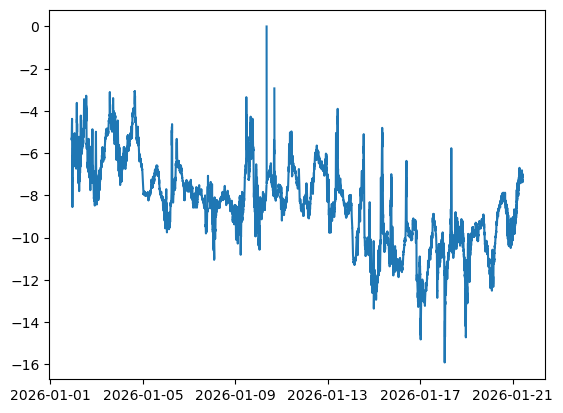

In [115]:
start='2026-01-01 22:00'
end='2026-01-21 23:00'
plt.plot(slowdata['Temp_5m_Avg'][start:end])

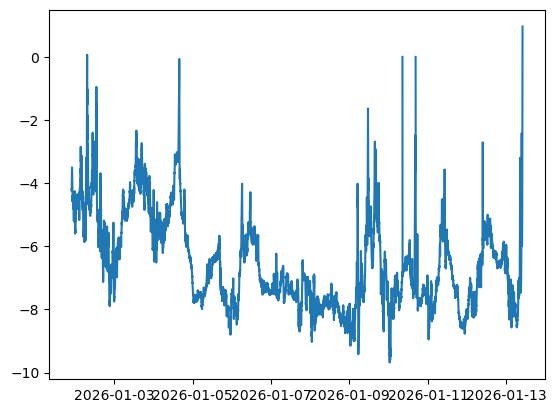

In [ ]:
start='2026-01-01 22:00'
end='2026-01-21 23:00'
plt.plot(slowdata['Temp_26m_Avg'][start:end])

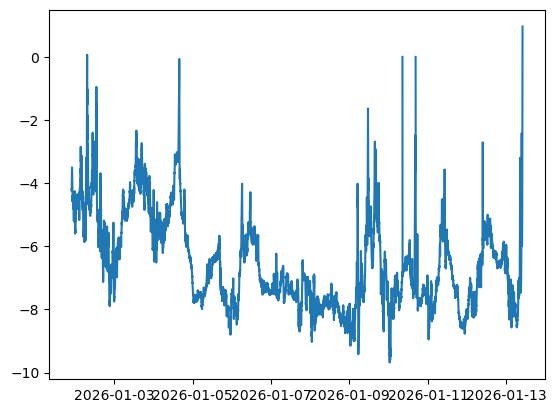

In [123]:
start='2026-01-01 22:00'
end='2026-01-21 23:00'
plt.plot(slowdata['Temp_26m_Avg'][start:end])

Using 2025 calibration coefficients
{'A': 4820.04, 'B': 3792900.0, 'C': -115477000.0, 'H2O_Zero': 0.7087, 'H20_Span': 0.9885}
Reading data from /media/engbers/2906-62A0/20251222_SFC
Reading data from /media/engbers/2906-62A0/20251222_SPC_SFC
Reading data from /media/engbers/2906-62A0/20251222_SPC_SFC_processed


(<Figure size 1300x1400 with 7 Axes>,
 array([<Axes: ylabel='Temperature [oC]'>, <Axes: ylabel='RH wrt ice [%]'>,
        <Axes: ylabel='Wind Direction'>, <Axes: ylabel='Wind Speed[ms-1]'>,
        <Axes: ylabel='Net Radiation [Wm-2]'>,
        <Axes: ylabel='Net Radiation [Wm-2]'>,
        <Axes: ylabel='Flowcapt [g/m2/s]'>], dtype=object))

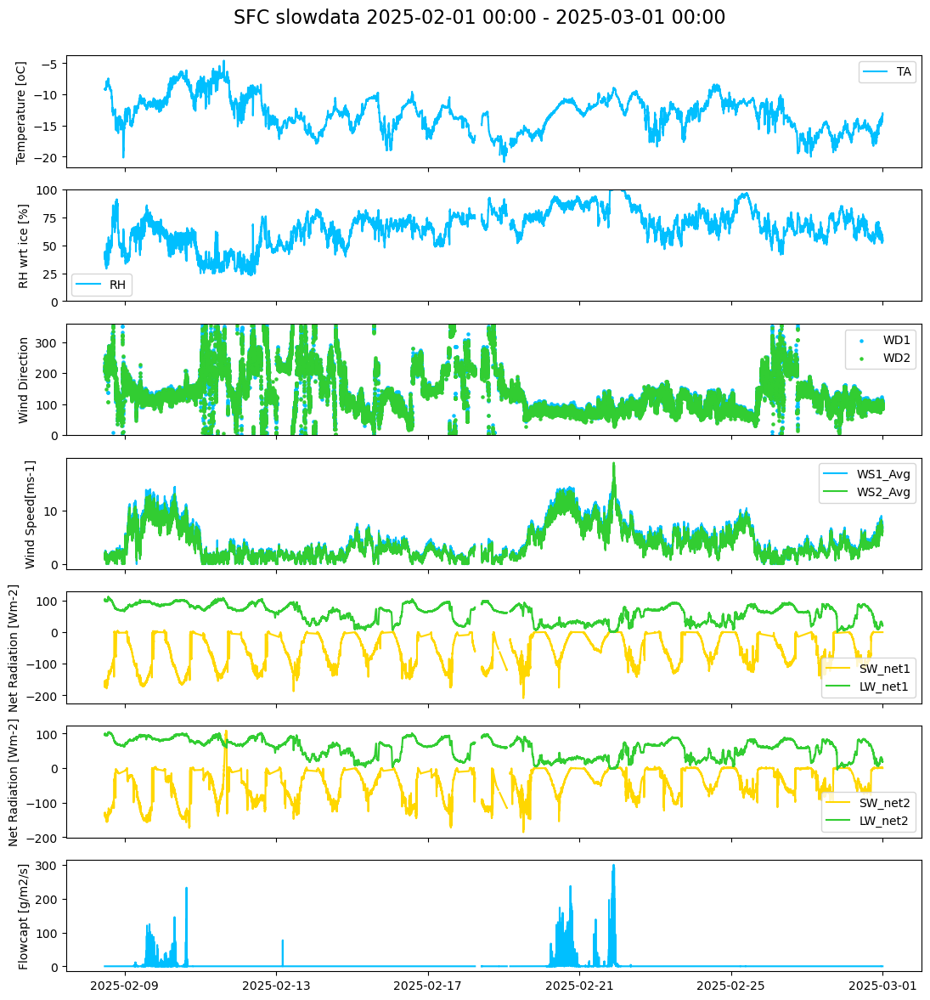

In [12]:
"""READ AND CLEAN SLOWDATA"""
folder='/media/engbers/2906-62A0/'
# folder='/run/user/72637/gvfs/smb-share:domain=INTRANET,server=samba.hpc.epfl.ch,share=cryos,user=engbers/CRYOS/Projects/Antarctica/PrincessElisabeth/Season_2024-2025/DATA/converted/'
sensor='SFC'
start='2025-02-01 00:00'
end='2025-03-01 00:00'

"""GET SENSOR INFO"""
plim, calibration_coefficients, heights = get_sensor_info(sensor, 2025)

"""READ FAST AND SLOW DATA from folder"""
slowdata=read_data(folder, 'slow', sensor, start, end, plot_data=False)

"""CLEAN SLOWDATA"""
slowdata_cleaned=clean_slowdata(slowdata)
plot_SFC_slowdata(slowdata_cleaned, sensor, start, end)

(20132.0, 20269.0)

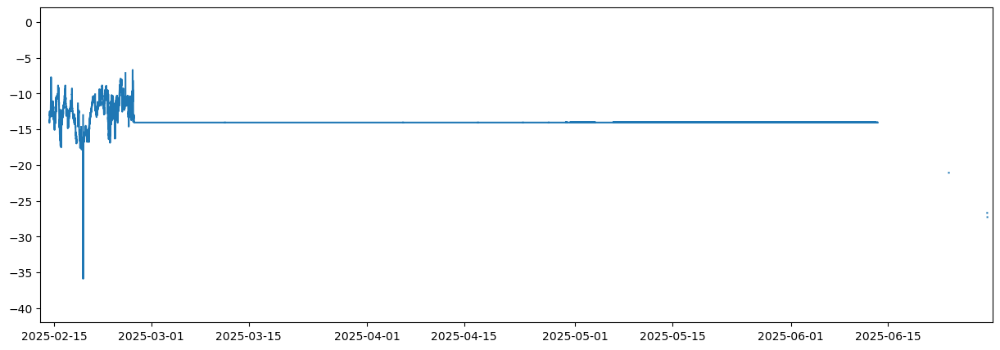

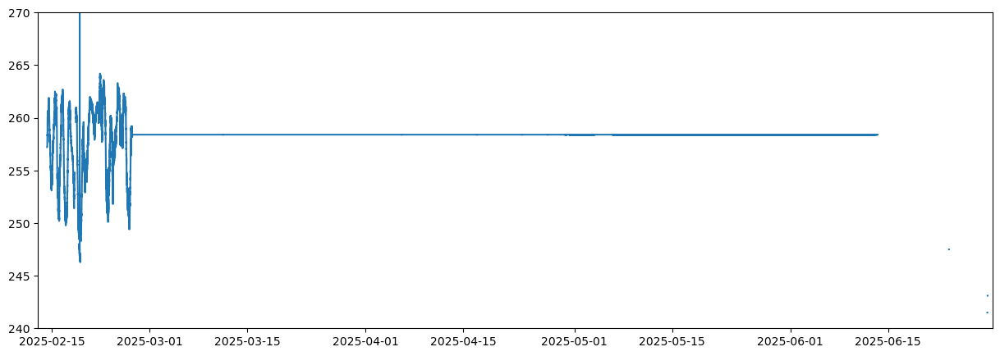

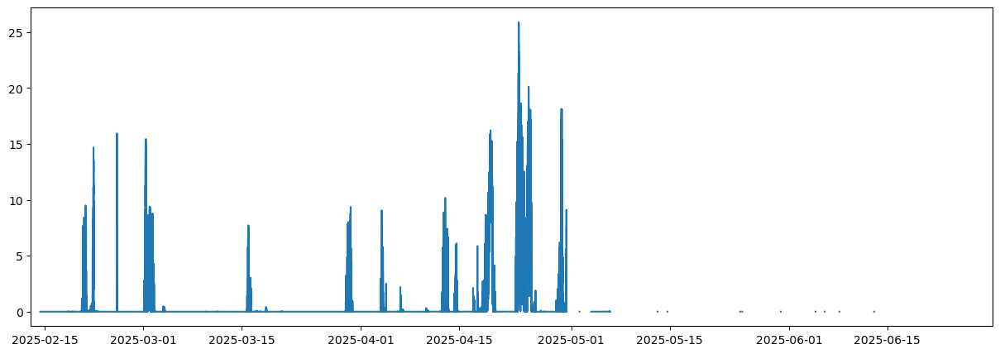

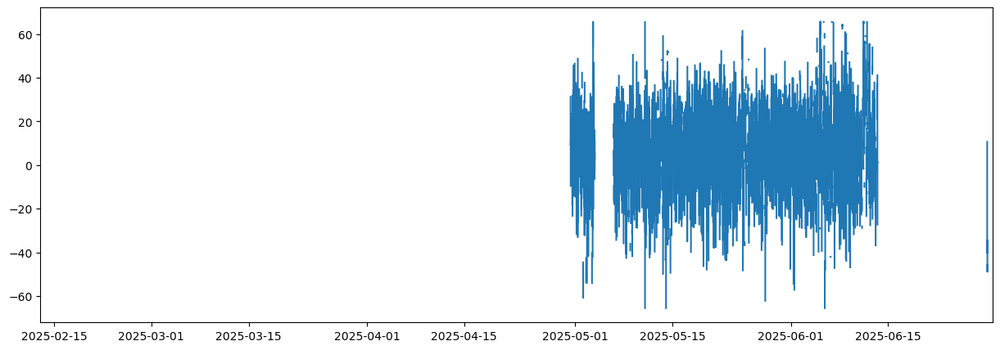

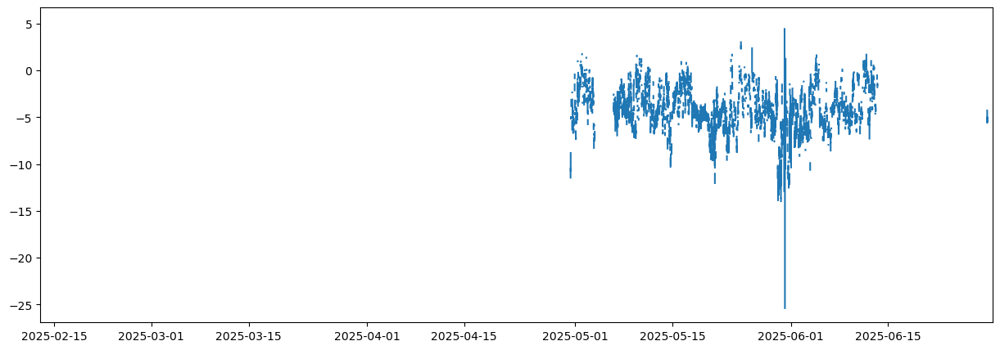

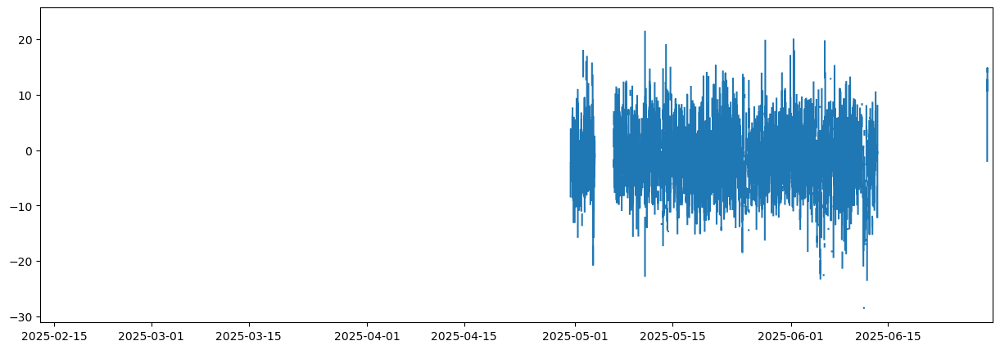

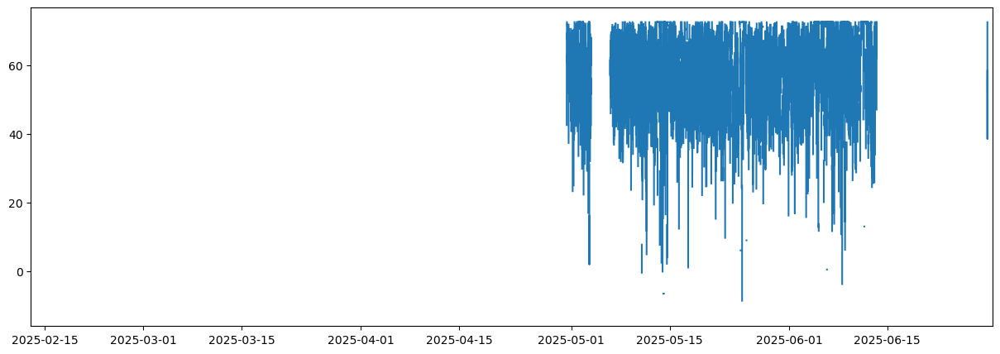

In [31]:
start=pd.Timestamp('2025-02-13 00:00')
end=pd.Timestamp('2025-06-30 00:00')
plt.figure(figsize=(15,5))
plt.plot(slowdata['Temp_5m_Avg'])
plt.xlim(start, end)
plt.figure(figsize=(15,5))
plt.plot(slowdata['SFTempK'])
plt.ylim(240, 270)
plt.xlim(start, end)
plt.figure(figsize=(15,5))
plt.plot(slowdata['WS_5m_Avg'])
plt.xlim(start, end)
plt.figure(figsize=(15,5))
plt.plot(slowdata['Ux_5m_Avg'])
plt.xlim(start, end)
plt.figure(figsize=(15,5))
plt.plot(slowdata['Uy_5m_Avg'])
plt.xlim(start, end)
plt.figure(figsize=(15,5))
plt.plot(slowdata['Uz_5m_Avg'])
plt.xlim(start, end)
plt.figure(figsize=(15,5))
plt.plot(slowdata['Ts_5m_Avg'])
plt.xlim(start, end)




In [ ]:
SPC_folder ='/media/engbers/2906-62A0/20251222_SPC_SFC_processed'
SPC=[]
for file in glob.glob(os.path.join(SPC_folder, '*.csv')):
    print(file)
    pd_SPC = pd.read_csv(file)
    SPC.append(pd_SPC)

# after the loop
SPC_all = pd.concat(SPC, sort=False)  # reset index across all files

/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250208_112346Snow-SPC_SFC-1sec-org-0000.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250218_213111Snow-SPC_SFC-1sec-org-000A.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250219_000001Snow-SPC_SFC-1sec-org-000A.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250219_040701Snow-SPC_SFC-1sec-org-000B.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250220_000001Snow-SPC_SFC-1sec-org-000B.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250220_214302Snow-SPC_SFC-1sec-org-000C.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250221_000001Snow-SPC_SFC-1sec-org-000C.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250221_111623Snow-SPC_SFC-1sec-org-000D.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250221_113523Snow-SPC_SFC-1sec-org-000E.csv
/media/engbers/2906-62A0/20251222_SPC_SFC_processed/U250221_132106Snow-SPC_SFC-1sec-org-000F.csv
/media/engbers/2906-62A0/20251

In [3]:
SPC_all = pd.concat(SPC, sort=False)  # reset index across all files

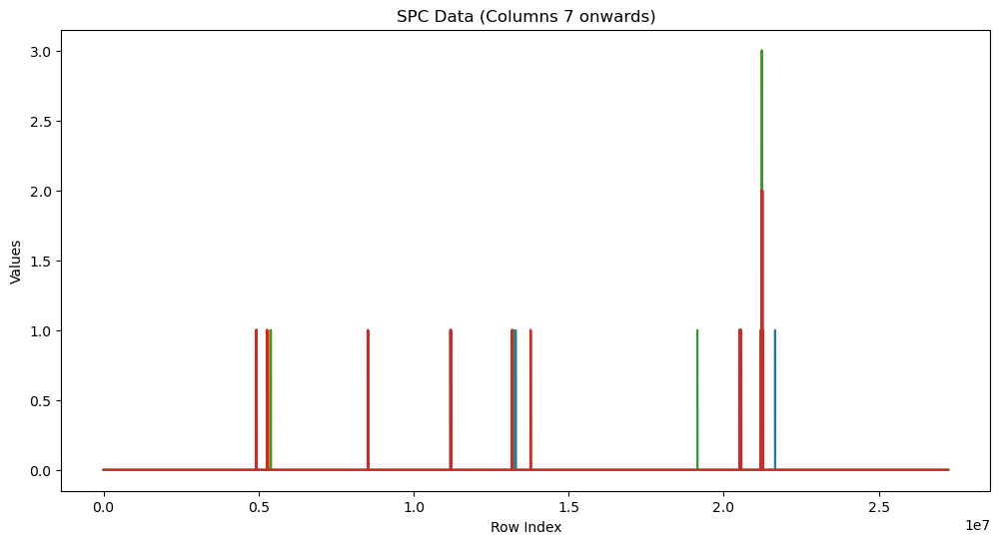

In [ ]:
# select all rows and columns from column index 7 to the last column
SPC_all_cols7_onwards = SPC_all.iloc[:, 30:34]
# Reset index to avoid matplotlib issues with non-numeric indices
SPC_all_cols7_onwards = SPC_all_cols7_onwards.reset_index(drop=True)
plt.figure(figsize=(12, 6))
plt.plot(SPC_all_cols7_onwards)
plt.xlabel('Row Index')
plt.ylabel('Values')
plt.title('SPC Data (Columns 7 onwards)')
plt.show()

KeyError: 0

In [5]:
df2=df.drop([0,1])
df2

,TIMESTAMP,RECORD,BattV_B_Min,PTemp_B_Avg,Temp_5m_Avg,RH_5m_Avg,SBTempK,SFTempK,SWdn_5m,CS320_T_5m,...,wnd_dir_compass_5m,wnd_dir_csat3_5m,wnd_spd_5m,rslt_wnd_spd_5m,std_wnd_dir_5m,csat_warnings_5m,delT_f_Tot_5m,sigl_f_Tot_5m,amph_f_Tot_5m,ampl_f_Tot_5m
2,2025-02-14 07:38:00,0,0,-11.12,-13.75,19.55,260.1,257.2,85,-8.54,...,0,0,0,0,0,0,0,0,0,0
3,2025-02-14 07:39:00,1,11.96,-11.4,-14.09,18.67,260.1,257.2,85.8,-8.53,...,0,0,0,0,0,0,0,0,0,0
4,2025-02-14 07:40:00,2,12,-11.39,-14.02,18.84,260.2,257.3,87.3,-8.46,...,0,0,0,0,0,0,0,0,0,0
5,2025-02-14 07:41:00,3,11.79,-11.38,-13.99,18.55,260.3,257.3,89,-8.39,...,0,0,0,0,0,0,0,0,0,0
6,2025-02-14 07:42:00,4,11.96,-11.36,-13.97,19.02,260.4,257.3,90.3,-8.3,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
980,2025-02-14 23:56:00,978,11.28,-14.65,-13.57,24.14,258,254,-1.812,-14.21,...,0,0,0,0,0,0,0,0,0,0
981,2025-02-14 23:57:00,979,11.36,-14.65,-13.61,24.46,257.9,254,-1.657,-14.27,...,0,0,0,0,0,0,0,0,0,0
982,2025-02-14 23:58:00,980,11.28,-14.66,-13.56,24.43,257.9,254,-1.675,-14.28,...,0,0,0,0,0,0,0,0,0,0
983,2025-02-14 23:59:00,981,11.6,-14.66,-13.64,24.16,257.9,254.3,-1.776,-14.27,...,0,0,0,0,0,0,0,0,0,0
